# **0 - Setup** ✅

##**0.1** - install

In [ ]:
!pip install kneed

##**0.2** - import

In [ ]:
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import scipy
import sklearn
import kneed

import math
from google.colab import files

import torch
import torch.nn as nn

from tqdm.auto import tqdm

##**0.3** - utils

In [ ]:
# clean the working directory
!rm -rf sample_data

# **`1 - Data`**

## 1.1 - load data

In [ ]:
# upload the dataset manually

# check its csv formatting
with open('dataset.csv', 'r') as f:
        print(f.readline())
        print(f.readline())
        print(f.readline())

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  645k  100  645k    0     0   750k      0 --:--:-- --:--:-- --:--:--  750k
Row;Dim_0;Dim_1=0;Dim_2=0;Dim_3=0;Dim_4=0;Dim_5=0;Dim_6=0;Dim_7=0;Dim_8=0;Dim_9=0;Dim_10=0;Dim_11=0;Dim_12=0;Dim_13=0;Dim_14=0;Dim_15=0;Dim_16;Dim_17;Dim_18;Dim_19;Dim_20;;

0;0,750000;1;0;1;1;1;1;1;0;1;1;1;1;1;1;1;0,001132;0,080780;0,197324;0,300926;0,225000;;

1;0,239583;1;1;1;1;1;1;1;1;1;1;1;1;1;1;1;0,000472;0,164345;0,235786;0,537037;0,165625;;



In [ ]:
# bash commands to change the formatting of the csv file
!sed -i 's/;;//' dataset.csv
!sed -i 's/,/./g' dataset.csv
!sed -i 's/;/,/g' dataset.csv

# check conversion
with open('dataset.csv', 'r') as f:
        print(f.readline())
        print(f.readline())
        print(f.readline())

Row,Dim_0,Dim_1=0,Dim_2=0,Dim_3=0,Dim_4=0,Dim_5=0,Dim_6=0,Dim_7=0,Dim_8=0,Dim_9=0,Dim_10=0,Dim_11=0,Dim_12=0,Dim_13=0,Dim_14=0,Dim_15=0,Dim_16,Dim_17,Dim_18,Dim_19,Dim_20

0,0.750000,1,0,1,1,1,1,1,0,1,1,1,1,1,1,1,0.001132,0.080780,0.197324,0.300926,0.225000

1,0.239583,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0.000472,0.164345,0.235786,0.537037,0.165625



In [ ]:
# load the dataset with pandas
df = pd.read_csv('dataset.csv', index_col = 0)

In [ ]:
# check its types and the number of null values
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7200 entries, 0 to 7199
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Dim_0     7200 non-null   float64
 1   Dim_1=0   7200 non-null   int64  
 2   Dim_2=0   7200 non-null   int64  
 3   Dim_3=0   7200 non-null   int64  
 4   Dim_4=0   7200 non-null   int64  
 5   Dim_5=0   7200 non-null   int64  
 6   Dim_6=0   7200 non-null   int64  
 7   Dim_7=0   7200 non-null   int64  
 8   Dim_8=0   7200 non-null   int64  
 9   Dim_9=0   7200 non-null   int64  
 10  Dim_10=0  7200 non-null   int64  
 11  Dim_11=0  7200 non-null   int64  
 12  Dim_12=0  7200 non-null   int64  
 13  Dim_13=0  7200 non-null   int64  
 14  Dim_14=0  7200 non-null   int64  
 15  Dim_15=0  7200 non-null   int64  
 16  Dim_16    7200 non-null   float64
 17  Dim_17    7200 non-null   float64
 18  Dim_18    7200 non-null   float64
 19  Dim_19    7200 non-null   float64
 20  Dim_20    7200 non-null   float64
d

In [ ]:
# print some statistics
df.describe()

,Dim_0,Dim_1=0,Dim_2=0,Dim_3=0,Dim_4=0,Dim_5=0,Dim_6=0,Dim_7=0,Dim_8=0,Dim_9=0,...,Dim_11=0,Dim_12=0,Dim_13=0,Dim_14=0,Dim_15=0,Dim_16,Dim_17,Dim_18,Dim_19,Dim_20
count,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,...,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000
mean,0.531790,0.695694,0.869444,0.984583,0.987222,0.961667,0.989167,0.985972,0.983194,0.934444,...,0.987361,0.991806,0.974444,0.999861,0.951111,0.009172,0.108506,0.179649,0.374250,0.173773
std,0.197156,0.460145,0.336937,0.123212,0.112322,0.192013,0.103525,0.117613,0.128551,0.247521,...,0.111718,0.090158,0.157816,0.011785,0.215651,0.043357,0.042001,0.060148,0.088354,0.056402
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.375000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001340,0.091922,0.145485,0.324074,0.145312
50%,0.562500,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.003208,0.109192,0.175585,0.370370,0.170313
75%,0.687500,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.005094,0.119777,0.205686,0.402778,0.195313
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## 1.2 - data exploration

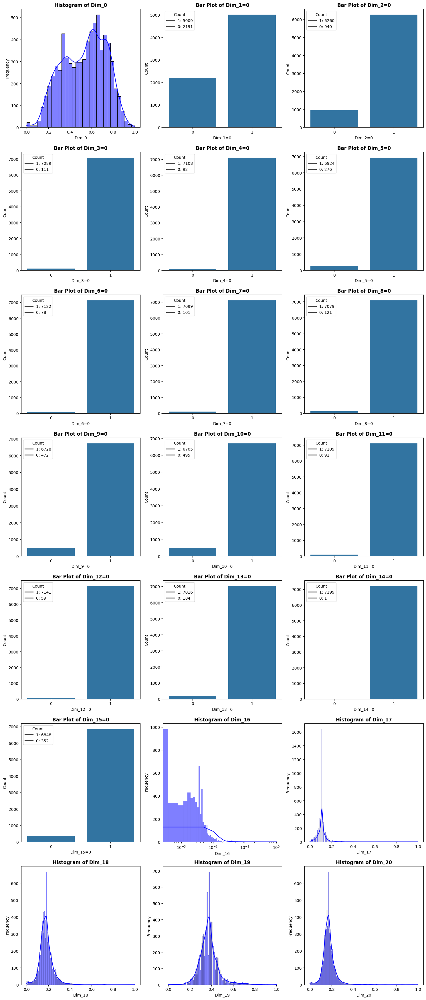

In [ ]:
# plot every dataset column as an histogram/bar plot

fig, axes = plt.subplots(7, 3, figsize=(15, 35))

axes = axes.flatten()

binary_mask = df.nunique() <= 2

# loop through the subplots and draw the appropriate plot
for i, col in enumerate(df.columns):

    if binary_mask[col]:
        value_counts = df[col].value_counts()
        sns.barplot(x=value_counts.index, y=value_counts.values, ax=axes[i])
        axes[i].legend(title='Count', labels=[f'{index}: {count}' for index, count in zip(value_counts.index, value_counts.values)])
        axes[i].set_title(f'Bar Plot of {col}', fontweight='bold')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
    else:
        sns.histplot(df[col], ax=axes[i], kde=True, color='blue')
        axes[i].set_title(f'Histogram of {col}', fontweight='bold')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')
        if i == 16:
          axes[i].set_xscale('log')


plt.tight_layout()
plt.show()

from a first exploration of the data I see that almost all binary variables have highly unbalanced distributions. For this reason I will treat every binary variable asymmetrically (sparse data). I will use cosine or jaccard distance(jaccard is better).

The only exception will be the first binary variable (dim_1), which has counts in the same order of magnitude. I will use simple matching distance.

All the continuous variables are min-max normalised in the 0-1 range.

As for variables 17 to 20, they seem reasonably normal, with spikes in the center, this suggests me that there should have been some sort of mean/median data imputation procedure.

As for variable 16, it has a very bizzarre distribution. is resembles an exponential distribution. But also features a peak in the middle.


## 1.3 - preprocessing


In [ ]:
# print column variable names to define the new order later
print(df.columns)

Index(['Dim_0', 'Dim_1=0', 'Dim_2=0', 'Dim_3=0', 'Dim_4=0', 'Dim_5=0',
       'Dim_6=0', 'Dim_7=0', 'Dim_8=0', 'Dim_9=0', 'Dim_10=0', 'Dim_11=0',
       'Dim_12=0', 'Dim_13=0', 'Dim_14=0', 'Dim_15=0', 'Dim_16', 'Dim_17',
       'Dim_18', 'Dim_19', 'Dim_20'],
      dtype='object')


In [ ]:
# reorder the dataset columns to put all binary variables in front of continuous ones
new_order = ['Dim_1=0', 'Dim_2=0', 'Dim_3=0', 'Dim_4=0', 'Dim_5=0','Dim_6=0', 'Dim_7=0',
            'Dim_8=0', 'Dim_9=0', 'Dim_10=0', 'Dim_11=0', 'Dim_12=0', 'Dim_13=0', 'Dim_14=0',
            'Dim_15=0', 'Dim_0', 'Dim_16', 'Dim_17','Dim_18', 'Dim_19', 'Dim_20']

df = df[new_order]

del new_order

In [ ]:
# for those values that are going to be trates as sparse, swap their binary values
sparse_columns = ['Dim_2=0', 'Dim_3=0', 'Dim_4=0', 'Dim_5=0',
       'Dim_6=0', 'Dim_7=0', 'Dim_8=0', 'Dim_9=0', 'Dim_10=0', 'Dim_11=0',
       'Dim_12=0', 'Dim_13=0', 'Dim_14=0', 'Dim_15=0']

df[sparse_columns] = 1 - df[sparse_columns]

del sparse_columns

one-hot encode variable Dim_1=0 as I consider it to be categorical but I want to handle it with sparse methods. For example I wanted to use smc on it while jaccard on others, with this encoding jaccard will be equivalent to smc.

In [ ]:
# get a one hot encoding of the first binary variable to treat it as categorical

one_hot = pd.get_dummies(df['Dim_1=0'], prefix='Dim_1=0', dtype = int)

df = pd.concat([one_hot, df], axis=1)

df = df.drop(columns=['Dim_1=0'])

print(df.columns)

del one_hot



Index(['Dim_1=0_0', 'Dim_1=0_1', 'Dim_2=0', 'Dim_3=0', 'Dim_4=0', 'Dim_5=0',
       'Dim_6=0', 'Dim_7=0', 'Dim_8=0', 'Dim_9=0', 'Dim_10=0', 'Dim_11=0',
       'Dim_12=0', 'Dim_13=0', 'Dim_14=0', 'Dim_15=0', 'Dim_0', 'Dim_16',
       'Dim_17', 'Dim_18', 'Dim_19', 'Dim_20'],
      dtype='object')


then, I will drop variable 14 as it characterises only a single data point

In [ ]:
# drop column 14
df = df.drop(columns=['Dim_14=0'])

print(df.columns)


Index(['Dim_1=0_0', 'Dim_1=0_1', 'Dim_2=0', 'Dim_3=0', 'Dim_4=0', 'Dim_5=0',
       'Dim_6=0', 'Dim_7=0', 'Dim_8=0', 'Dim_9=0', 'Dim_10=0', 'Dim_11=0',
       'Dim_12=0', 'Dim_13=0', 'Dim_15=0', 'Dim_0', 'Dim_16', 'Dim_17',
       'Dim_18', 'Dim_19', 'Dim_20'],
      dtype='object')


In [ ]:
# rename columns for readibility
new_column_names = {
    'Dim_1=0_0': 'cat_0_dummy_0',
    'Dim_1=0_1': 'cat_0_dummy_1',
    'Dim_2=0': 'bin_0',
    'Dim_3=0': 'bin_1',
    'Dim_4=0': 'bin_2',
    'Dim_5=0': 'bin_3',
    'Dim_6=0': 'bin_4',
    'Dim_7=0': 'bin_5',
    'Dim_8=0': 'bin_6',
    'Dim_9=0': 'bin_7',
    'Dim_10=0': 'bin_8',
    'Dim_11=0': 'bin_9',
    'Dim_12=0': 'bin_10',
    'Dim_13=0': 'bin_11',
    'Dim_15=0': 'bin_12',
    'Dim_0': 'con_0',
    'Dim_16': 'con_1',
    'Dim_17': 'con_2',
    'Dim_18': 'con_3',
    'Dim_19': 'con_4',
    'Dim_20': 'con_5'
}


df = df.rename(columns=new_column_names)

print(df.columns)

del new_column_names

Index(['cat_0_dummy_0', 'cat_0_dummy_1', 'bin_0', 'bin_1', 'bin_2', 'bin_3',
       'bin_4', 'bin_5', 'bin_6', 'bin_7', 'bin_8', 'bin_9', 'bin_10',
       'bin_11', 'bin_12', 'con_0', 'con_1', 'con_2', 'con_3', 'con_4',
       'con_5'],
      dtype='object')


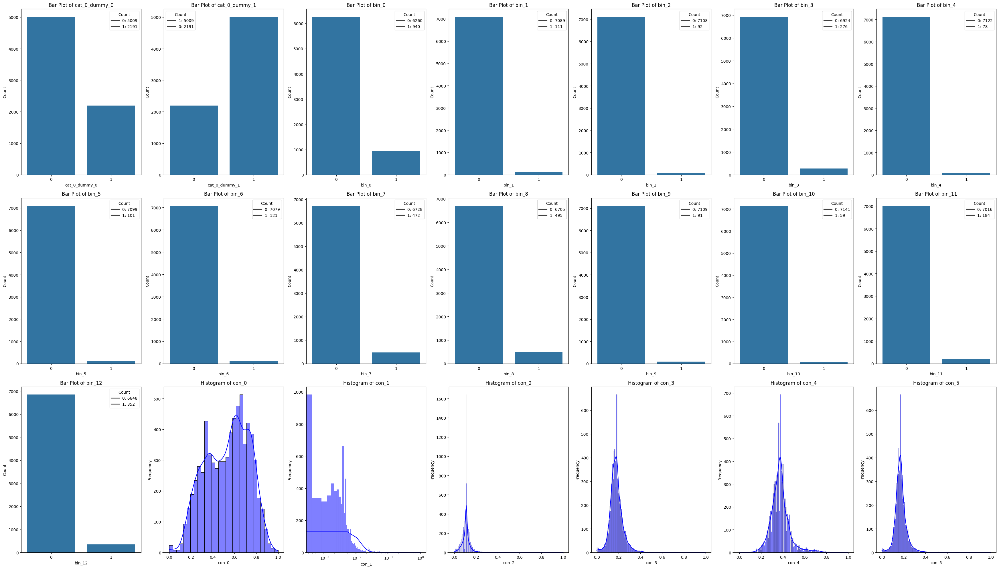

In [ ]:
# plot again every column of the dataset as an histogram/bar chart
fig, axes = plt.subplots(3, 7, figsize=(35, 20))

axes = axes.flatten()

binary_mask = df.nunique() <= 2

for i, col in enumerate(df.columns):

    if binary_mask[col]:
        value_counts = df[col].value_counts()
        sns.barplot(x=value_counts.index, y=value_counts.values, ax=axes[i])
        axes[i].legend(title='Count', labels=[f'{index}: {count}' for index, count in zip(value_counts.index, value_counts.values)])
        axes[i].set_title(f'Bar Plot of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
    else:
        sns.histplot(df[col], ax=axes[i], kde=True, color='blue')
        axes[i].set_title(f'Histogram of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')
        if i == 16:
          axes[i].set_xscale('log')

# Adjust layout
plt.tight_layout()
plt.show()

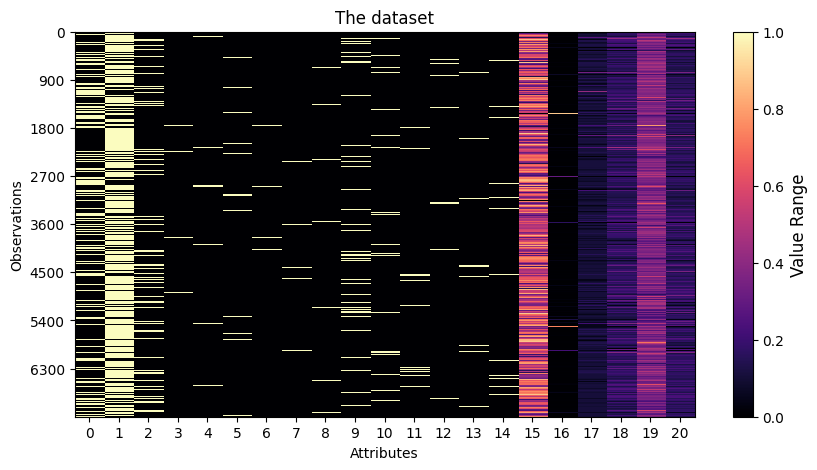

In [ ]:
# visualise the entire dataset as an heatmap
fig1 = plt.figure(figsize=(10,5))

im = plt.imshow(df.to_numpy(), interpolation='nearest', aspect='auto',  cmap='magma')
vmin = np.min(df.to_numpy())
vmax = np.max(df.to_numpy())
im.set_clim(vmin, vmax)

cbar = plt.colorbar(im, orientation='vertical')
cbar.set_label('Value Range', fontsize=12)

plt.xlabel('Attributes')
plt.xticks(np.arange(0, df.to_numpy().shape[1], step=1))
plt.ylabel('Observations')
plt.yticks(np.arange(0, df.to_numpy().shape[0], step=900))
plt.title('The dataset')
plt.show()

# **2 - Computing Distance Between Data Points**

To compute the distance between data point of mixed type I found in the literature the Grower distance. However to account for sparse variables I will take it as an ispiration to obtain a custom distance. The custom distance will be obtained as a weighted average between a jaccard distance on the binary part and a manhattan (or euclidean distance) on the continuos variables. I will scale the continuous distances to lay between 0 and 1, since they were already scaled, I just need to correct by the dimensionality (or its square root).

jaccard + euclidean(scale by sqrt(d)) / manhattan (scale by d)

In [ ]:
# the following function will implement the custom distance described above
# it returns the distances between pair of points in a single dataset X

def composite_distance_matrix_single(X,  binary_columns = range(0,14), continuous_columns = range(15,21), binary_metric = 'jaccard', continuous_metric='cityblock', squareform = True):

    n_binary = len(binary_columns) -1 # -1 to correct the dummy double counting
    n_continuous = len(continuous_columns)

    scaling = n_continuous

    if continuous_metric == 'euclidean':
        scaling = math.sqrt(scaling)


    bin_dist =  scipy.spatial.distance.pdist(X[:,binary_columns],  metric=binary_metric)


    if squareform:
        bin_dist =  scipy.spatial.distance.squareform(bin_dist)

    con_dist =  scipy.spatial.distance.pdist(X[:,continuous_columns],  metric = continuous_metric) / scaling
    if squareform:
        con_dist =  scipy.spatial.distance.squareform(con_dist)

    comp_dist = (n_binary * bin_dist + n_continuous * con_dist) / (n_binary + n_continuous)

    return comp_dist

In [ ]:
# the following function will implement the custom distance described above
# it takes a two datasets and returns a distance matrix (m_X x m) whose entries represent distances between every pair of points from the two datasets

def composite_distance_matrix_double(X, Y, binary_columns = range(0,14), continuous_columns = range(15,21), continuous_metric='cityblock'):

    n_binary = len(binary_columns) -1 # -1 to correct the dummy double counting
    n_continuous = len(continuous_columns)

    scaling = n_continuous

    if continuous_metric == 'euclidean':
        scaling = math.sqrt(scaling)


    bin_dist =  scipy.spatial.distance.cdist(X[:,binary_columns], Y[:,binary_columns], metric='jaccard')

    con_dist =  scipy.spatial.distance.cdist(X[:,continuous_columns], Y[:,continuous_columns], metric = continuous_metric) / scaling

    comp_dist = (n_binary * bin_dist + n_continuous * con_dist) / (n_binary + n_continuous)

    return comp_dist


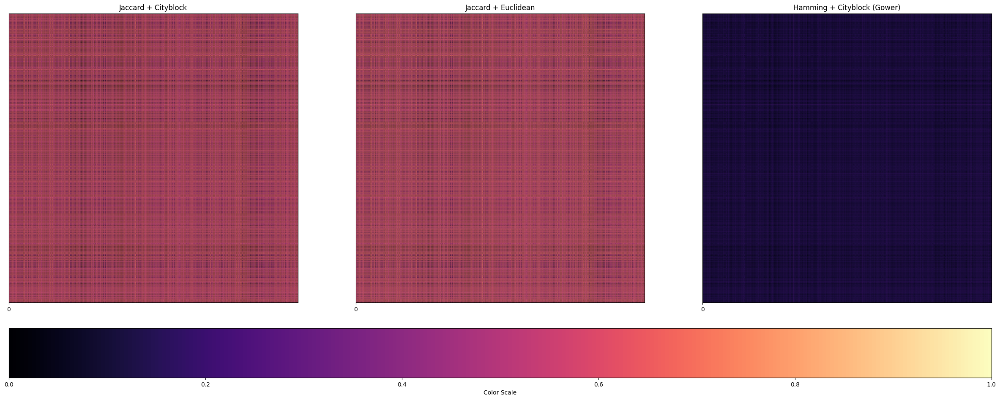

In [ ]:
# Here I will wisualise the distances produced by different metrics combinations
fig, axs = plt.subplots(1,3,figsize=(30,20))

distance_matrix = composite_distance_matrix_single(df.to_numpy(),  binary_metric = 'jaccard',  continuous_metric='cityblock')

im0 = axs[0].imshow(distance_matrix,  cmap='magma', vmin=0, vmax=1)
axs[0].set_xticks(np.arange(0, df.to_numpy().shape[1], step=900))
axs[0].set_yticks([])
axs[0].set_yticks([])
axs[0].set_title("Jaccard + Cityblock")

distance_matrix = composite_distance_matrix_single(df.to_numpy(), binary_metric = 'jaccard', continuous_metric='euclidean')

im1 = axs[1].imshow(distance_matrix,  cmap='magma', vmin=0, vmax=1)
axs[1].set_xticks(np.arange(0, df.to_numpy().shape[1], step=900))
axs[1].set_yticks([])
axs[1].set_title("Jaccard + Euclidean")

distance_matrix = composite_distance_matrix_single(df.to_numpy(), binary_metric = 'hamming', continuous_metric='cityblock')

im2 = axs[2].imshow(distance_matrix,  cmap='magma', vmin=0, vmax=1)
axs[2].set_xticks(np.arange(0, df.to_numpy().shape[1], step=900))
axs[2].set_yticks([])
axs[2].set_title("Hamming + Cityblock (Gower)")

fig.colorbar(im0, ax=axs, orientation='horizontal', label='Color Scale', fraction=0.1, pad=0.04)

plt.show()

# **3 - Clustering and PCA**

To try to understand the data better, and to prepare for some anomaly detection algorithms in the following section I will try understand if there are any natural clusters in the dataset.

## **PCA** ✅



<Axes: xlabel='PC1', ylabel='PC2'>

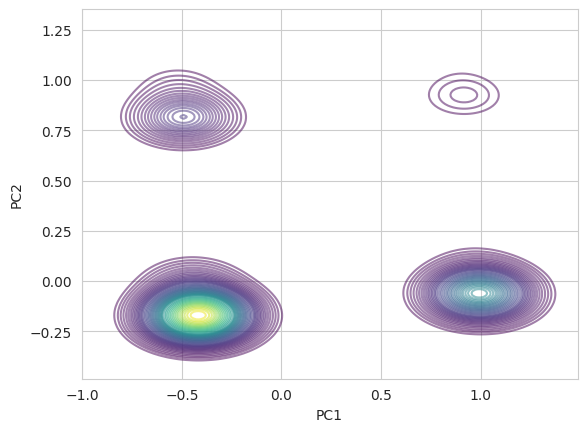

In [ ]:
X = df.to_numpy()

pca = sklearn.decomposition.PCA(n_components=2)
X_proj = pca.fit_transform(X)

X_proj_df = pd.DataFrame(X_proj, columns=['PC1', 'PC2'])

sns.set_style("whitegrid")
sns.kdeplot(data=X_proj_df, x='PC1', y='PC2', fill=False, cmap='viridis', alpha=0.5, levels=50)
#sns.scatterplot(data = X_proj_df, x = 'PC1', y = 'PC2', s = 100)


## **DBSCAN** ✅

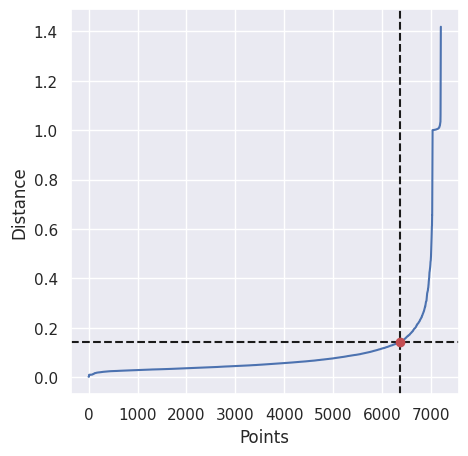

In [ ]:
# Knee method
neighborhood_order = 7
neighborhood_set = sklearn.neighbors.NearestNeighbors(n_neighbors=neighborhood_order).fit(X)
distances, indices = neighborhood_set.kneighbors(X)
distances = np.sort(distances[:,neighborhood_order-1], axis=0)
i = np.arange(len(distances))
knee = kneed.KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')
knee_x = knee.knee
knee_y = knee.knee_y



fig31 = plt.figure(figsize=(5,5))
plt.plot(distances)
plt.xlabel("Points")
plt.ylabel("Distance")
plt.grid()
plt.axvline(x=knee_x, color='k', linestyle='--')
plt.axhline(y=knee_y, color='k', linestyle='--')
plt.plot((knee_x), (knee_y), 'o', color='r')
plt.show()

In [ ]:
distance_matrix = composite_distance_matrix_single(df.to_numpy())

[-1  0  1  2  3]
[1674 3042 1661  559  264]


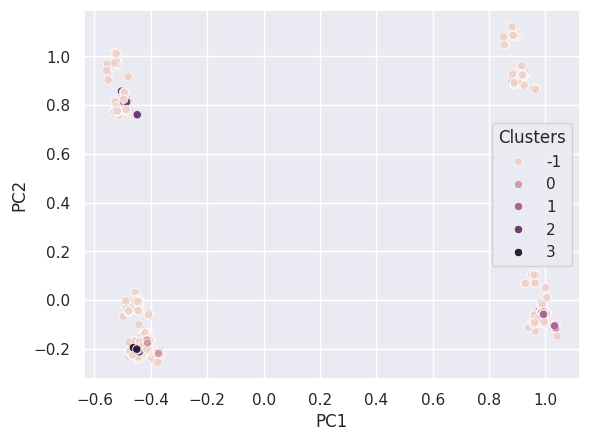

In [ ]:
dbscan = sklearn.cluster.DBSCAN(metric='precomputed', eps=knee_y, min_samples=250)
dbscan_labels = dbscan.fit_predict(distance_matrix)

clusters, counts = np.unique(dbscan_labels, return_counts=True)

print(clusters)
print(counts)

sns.set_theme(style='dark')

sns.scatterplot(data = X_proj_df, x = 'PC1', y = 'PC2', hue = dbscan_labels)

plt.legend( title='Clusters')
plt.grid()
plt.show()

In [ ]:
print(sklearn.metrics.silhouette_score(distance_matrix, dbscan_labels, metric='precomputed'))

0.6429127133536442


## **Hierarchical** ✅

In [ ]:
distance_matrix = composite_distance_matrix_single(df.to_numpy(), squareform=False)

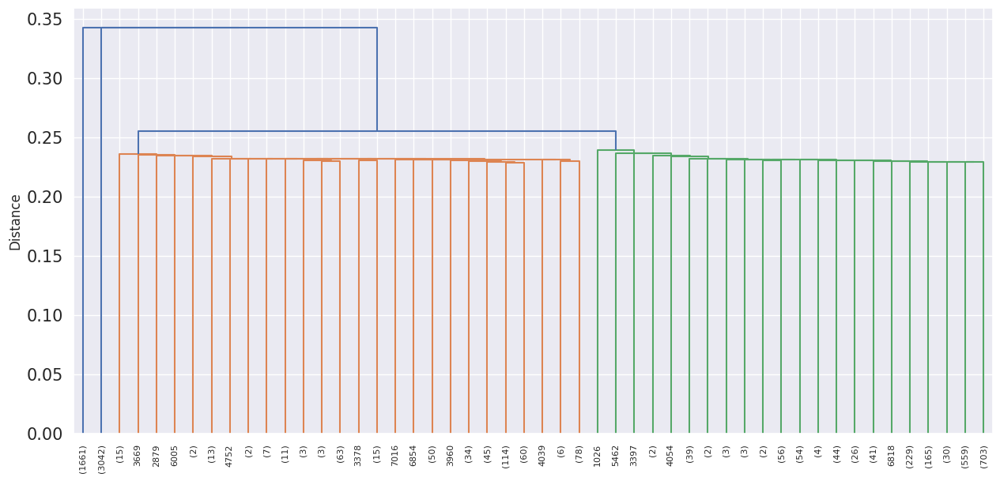

In [ ]:
fig = plt.figure(figsize=(15, 7), facecolor='white')
linkage = scipy.cluster.hierarchy.linkage(distance_matrix, method='single')
scipy.cluster.hierarchy.dendrogram(linkage, no_plot=0, truncate_mode = 'lastp', p = 50)

#plt.xticks(np.arange(0, 7200, 900))

plt.tick_params(axis='y', which='major', labelsize=15)
plt.tick_params(axis='x', which='major', labelsize=8)
plt.ylabel('Distance')

plt.grid()
plt.show()




(7200,)
[3 1 1 ... 1 0 1]
We got 4 cluster(s).


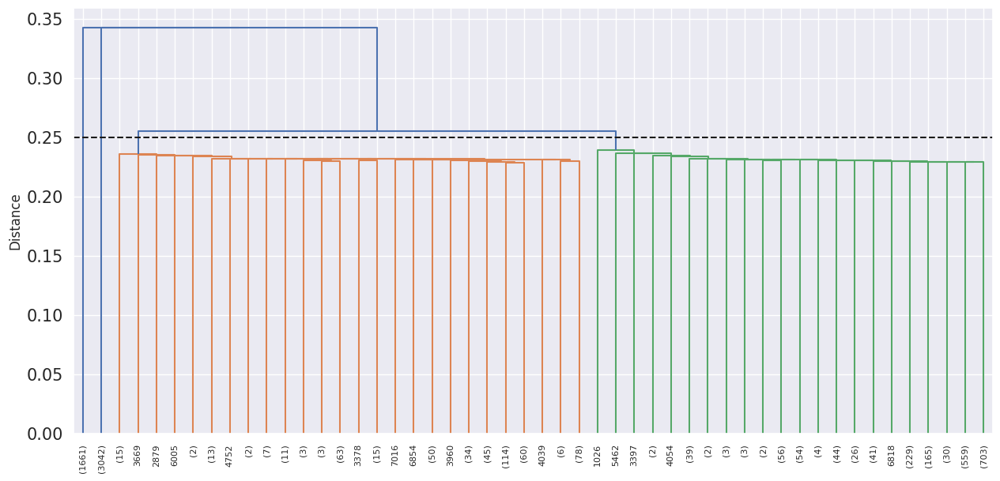

In [ ]:
# Cut the forest to have a certain inter-cluster distance (max_d)
max_d = 0.25

# Form the clusters. Note: subtract 1 in order for the labels to start from 0 (as it happens in k-means++)
hierarchical_labels = scipy.cluster.hierarchy.fcluster(linkage, max_d, criterion='distance') - 1

print(hierarchical_labels.shape)
print(hierarchical_labels)

# Confirm that you cut correctly, to have N clusters
Kh = hierarchical_labels.max() + 1
print("We got %d cluster(s)." % Kh)

# Add a vertical line to the dendrogram indicating the cut
plt.figure(fig)
plt.axhline(y=max_d, color='k', linestyle='--')
plt.show()

clusters: [0 1 2 3], counts: [1661 3042  530 1967]


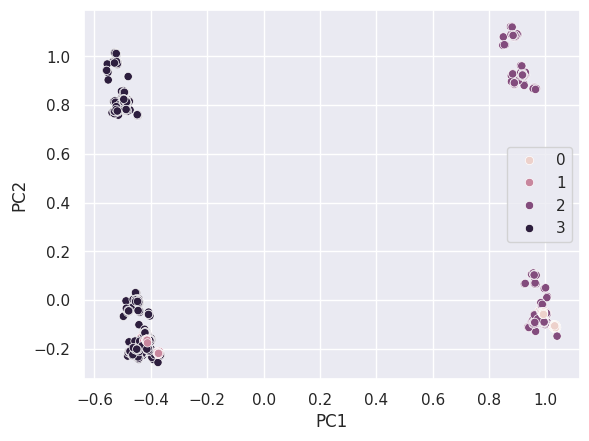

In [ ]:
# Silhouette score
distance_matrix = composite_distance_matrix_single(df.to_numpy())

clusters, counts = np.unique(hierarchical_labels, return_counts=True)
print(f"clusters: {clusters}, counts: {counts}")


# Visualize this clustering solution
#sns.scatterplot(data = X_proj_df[hierarchical_labels==0], x = 'PC1', y = 'PC2')
sns.scatterplot(data = X_proj_df, x = 'PC1', y = 'PC2', hue = hierarchical_labels)

sns.set_theme(style='dark')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid()
plt.show()

In [ ]:
print(sklearn.metrics.silhouette_score(distance_matrix, hierarchical_labels, metric = 'precomputed'))

0.5922482634839937


# **4 - Anomaly Detection Methods**

In [ ]:
scores = {}

## **Clustering based** ✅




In [ ]:
scores['clustering'] = {}

### **DBSCAN**

The dbscan method used above readily gives a let of outlier labels (-1).

In [ ]:
dbscan_outliers = (dbscan_labels == -1).astype(int)
print(dbscan_outliers.sum())

scores['clustering']['dbscan'] = dbscan_outliers

1674


### **Hierarchical**

From the hierarchical analysis performed above, I decided to consider cluster 2's elements as outliers

In [ ]:
hierarchical_outliers = (hierarchical_labels == 2).astype(int)

print(hierarchical_outliers.sum())

scores['clustering']['hierarchical'] = hierarchical_outliers

530


### **Comparison**

Pearson correlation: 0.5121565499972781
1.0


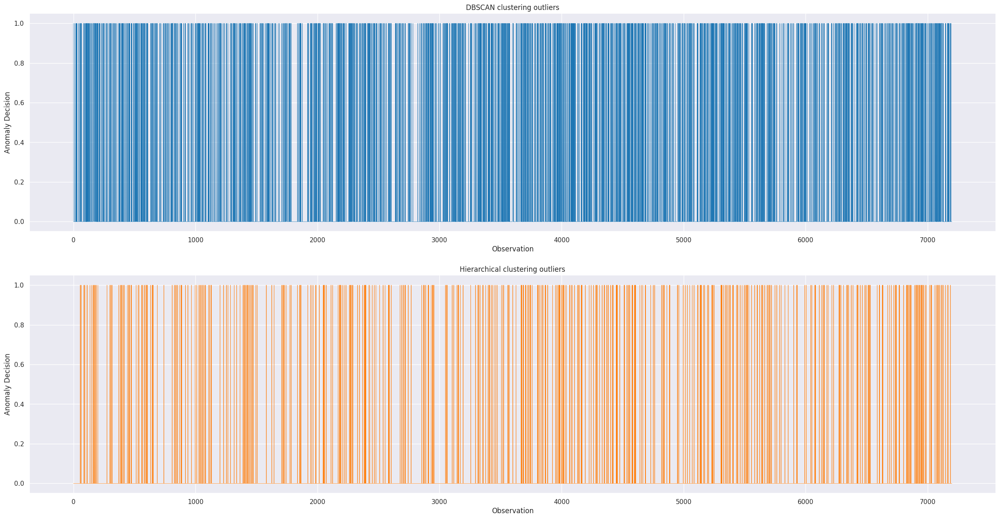

In [ ]:
correlation = np.corrcoef(hierarchical_outliers, dbscan_outliers)[0, 1]
print(f"Pearson correlation: {correlation}")

print((hierarchical_outliers + dbscan_outliers == 2).astype('int').sum() / hierarchical_outliers.sum())

fig, axes = plt.subplots(2, 1, figsize=(30, 15))

outlier_timeseries = [dbscan_outliers, hierarchical_outliers]
colors = ['tab:blue', 'tab:orange']
methods = ['DBSCAN', 'Hierarchical']

for i, (outliers, color, method)  in enumerate(zip(outlier_timeseries, colors, methods)):
    axes[i].plot(outliers, color=color, linewidth=0.5)
    axes[i].set_title(f"{method} clustering outliers")
    axes[i].set_xlabel("Observation")
    axes[i].set_ylabel("Anomaly Decision")
    axes[i].grid()

plt.show()

## **Reconstruction - PCA and Autoencoders** ✅



In [ ]:
scores['reconstruction'] = {}

### **PCA**

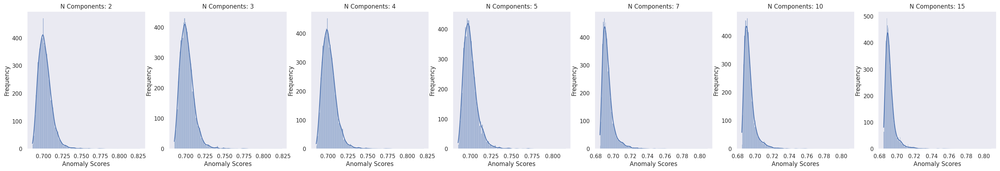

In [ ]:
X = df.to_numpy()

n_components = [2,3,4,5,7,10,15]

pca_scores = np.zeros((len(n_components), 7200))

fig, axes = plt.subplots(1, len(n_components), figsize=(5*len(n_components), 5))

for i, n in enumerate(n_components):

    pca = sklearn.decomposition.PCA(n_components = n)

    X_proj = pca.fit_transform(X)

    X_reconstructed = pca.inverse_transform(X_proj)

    reconstruction_error = composite_distance_matrix_double(X,X_reconstructed).diagonal()
    pca_scores[i,:] = reconstruction_error

    sns.histplot(reconstruction_error, kde=True, ax=axes[i])
    axes[i].set_title(f"N Components: {n}")
    axes[i].set_xlabel("Anomaly Scores")
    axes[i].set_ylabel("Frequency")

plt.show()



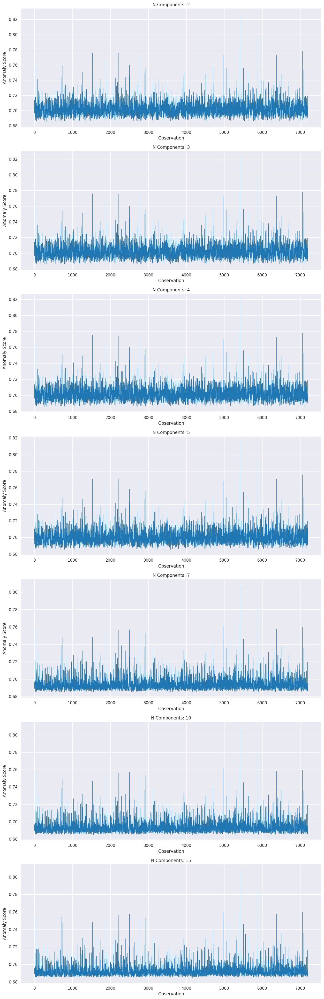

In [ ]:
fig, axes = plt.subplots(len(n_components), 1, figsize=(15, 7*len(n_components)))

for i, n in enumerate(n_components):
    axes[i].plot(pca_scores[i,:], color='tab:blue', linewidth=0.5)
    axes[i].set_title(f"N Components: {n}")
    axes[i].set_xlabel("Observation")
    axes[i].set_ylabel("Anomaly Score")
    axes[i].grid()

plt.show()

In [ ]:
# after visual inspection, decide which scores are to be retained for the final ensambling

# we can see above that the first two principal components are the most important,
# in fact, outliers scores are all very similar, hoever, they are all well behaved
# and my aggregation method allows me to keep them all

for i in range(pca_scores.shape[0]):
    pca_scores[i,:] = (pca_scores[i,:] - np.min(pca_scores[i,:])) / (np.max(pca_scores[i,:]) - np.min(pca_scores[i,:]))


scores['reconstruction']['pca'] = pca_scores

### **Autoencoder**

In [ ]:
#define the autoencoder class

class Autoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, int(hidden_dim+input_dim/2)),
            nn.ReLU(),
            nn.Linear(int(hidden_dim+input_dim/2), hidden_dim),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(hidden_dim, int(hidden_dim+input_dim/2)),
            nn.ReLU(),
            nn.Linear(int(hidden_dim+input_dim/2), input_dim),
            nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

    # the anomaly score function returns the reconstruction loss for the autoencoder
    def anomaly_scores(self, data_tensor):
        self.eval()
        with torch.no_grad():
            reconstructions = self.forward(data_tensor)
            anomaly_scores = torch.mean((reconstructions - data_tensor) ** 2, dim=1)
            return anomaly_scores


  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

  0%|          | 0/20000 [00:00<?, ?it/s]

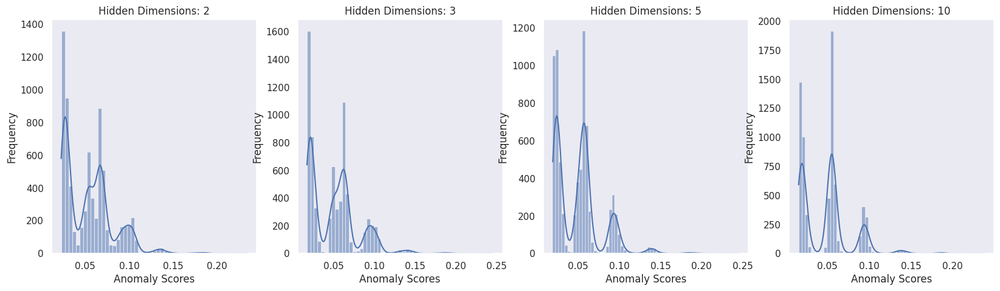

In [ ]:
hidden_dims = [2, 3, 5, 10]
epochs = 20000

fig, axes = plt.subplots(1, len(hidden_dims), figsize=(5*len(hidden_dims), 5))

autoencoder_scores = np.zeros((len(hidden_dims), 7200))

for i, hidden_dim in enumerate(hidden_dims):

    model = Autoencoder(input_dim=21, hidden_dim=hidden_dim)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
    data_tensor = torch.tensor(df.to_numpy(), dtype = torch.float32)
    criterion = nn.MSELoss()

    early_stop_buffer = np.ones(5)

    # Training loop
    for epoch in tqdm(range(epochs)):

        optimizer.zero_grad()

        inputs = data_tensor
        outputs = model(data_tensor)

        loss = criterion(outputs, inputs)
        loss.backward()

        optimizer.step()

        early_stop_buffer = np.append(early_stop_buffer[1:], loss.item())

        if early_stop_buffer.max() - early_stop_buffer.min() < 0.0001:
            break



    autoencoder_scores[i,:] = model.anomaly_scores(data_tensor).numpy()

    sns.histplot(autoencoder_scores[i,:], kde=True, ax=axes[i])
    axes[i].set_title(f"Hidden Dimensions: {hidden_dim}")
    axes[i].set_xlabel("Anomaly Scores")
    axes[i].set_ylabel("Frequency")

plt.show()

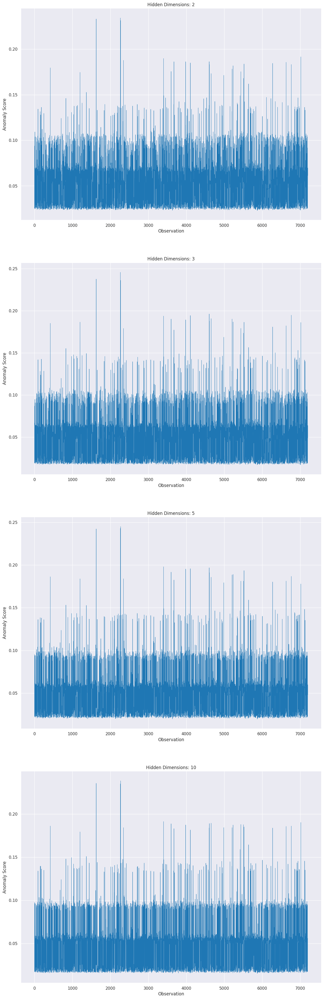

In [ ]:
fig, axes = plt.subplots(len(hidden_dims), 1, figsize=(15, 7*len(n_components)))

for i, h in enumerate(hidden_dims):
    axes[i].plot(autoencoder_scores[i,:], color='tab:blue', linewidth=0.5)
    axes[i].set_title(f"Hidden Dimensions: {h}")
    axes[i].set_xlabel("Observation")
    axes[i].set_ylabel("Anomaly Score")
    axes[i].grid()

plt.show()

In [ ]:
for i in range(autoencoder_scores.shape[0]):
    autoencoder_scores[i,:] = (autoencoder_scores[i,:] - np.min(autoencoder_scores[i,:])) / (np.max(autoencoder_scores[i,:]) - np.min(autoencoder_scores[i,:]))


scores['reconstruction']['autoencoder'] = autoencoder_scores

In [ ]:
print(autoencoder_scores)

[[0.33611208 0.03780082 0.01273562 ... 0.1846073  0.22171463 0.18166599]
 [0.30570975 0.03348986 0.01029974 ... 0.14229203 0.20476409 0.13921411]
 [0.33720465 0.03628314 0.01530279 ... 0.12623136 0.17893711 0.12668054]
 [0.37011714 0.02598803 0.00778816 ... 0.17910542 0.18002708 0.18234319]]


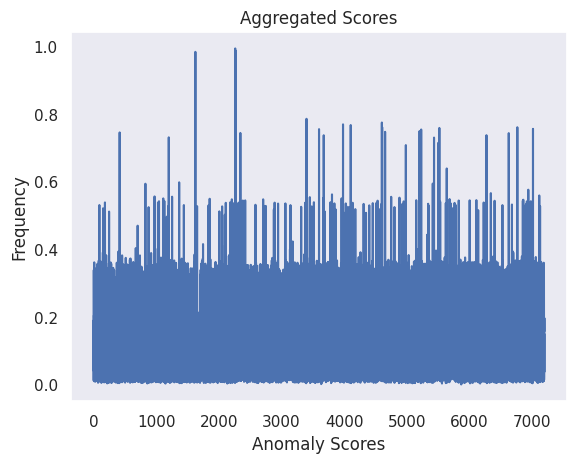

In [ ]:
plt.plot(np.mean(autoencoder_scores, axis = 0))
plt.title(f"Aggregated Scores")
plt.xlabel("Anomaly Scores")
plt.ylabel("Frequency")

plt.show()

## **Isolation Models** ✅

In [ ]:
scores['isolation'] = {}

### **One-Class SVM** ✅

In [ ]:
def custom_kernel(X, Y):

    distance_matrix = composite_distance_matrix_double(X, Y)

    return np.exp(-distance_matrix)

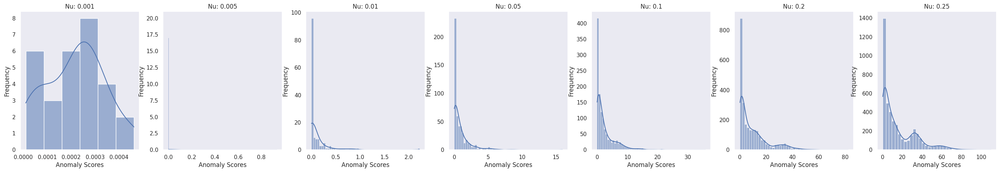

In [ ]:
nus = [0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.25]

fig, axes = plt.subplots(1, len(nus), figsize=(5*len(nus), 5))

ocsvm_scores = np.zeros((len(nus), 7200))

for i, nu in enumerate(nus):

    ocsvm = sklearn.svm.OneClassSVM(nu=nu, kernel=custom_kernel, gamma="scale")

    ocsvm.fit(df.to_numpy())

    ocsvm_scores[i,:] =  - ocsvm.decision_function(df.to_numpy())

    sns.histplot(ocsvm_scores[ocsvm_scores > 0], kde=True, ax=axes[i])
    axes[i].set_title(f"Nu: {nu}")
    axes[i].set_xlabel("Anomaly Scores")
    axes[i].set_ylabel("Frequency")

plt.show()

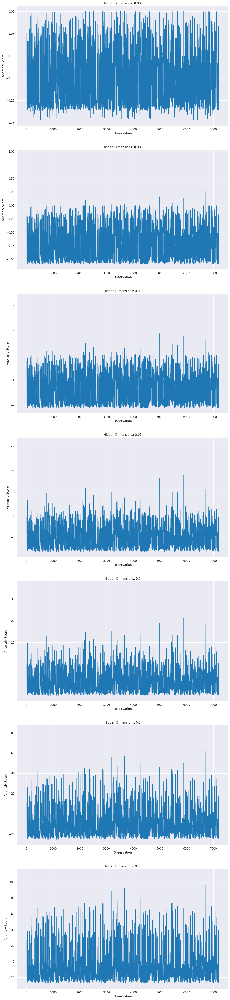

In [ ]:
fig, axes = plt.subplots(len(nus), 1, figsize=(15, 10*len(n_components)))

for i, nu in enumerate(nus):
    axes[i].plot(ocsvm_scores[i,:], color='tab:blue', linewidth=0.5)
    axes[i].set_title(f"Hidden Dimensions: {nu}")
    axes[i].set_xlabel("Observation")
    axes[i].set_ylabel("Anomaly Score")
    axes[i].grid()

plt.show()

In [ ]:
# collapse negative values to 0, now the metric is well behaved
ocsvm_scores = np.maximum(ocsvm_scores ,0)

for i in range(ocsvm_scores.shape[0]):
    ocsvm_scores[i,:] = (ocsvm_scores[i,:] - np.min(ocsvm_scores[i,:])) / (np.max(ocsvm_scores[i,:]) - np.min(ocsvm_scores[i,:]))


scores['isolation']['ocsvm'] = ocsvm_scores[2,:]

### **Isolation Forest** ✅

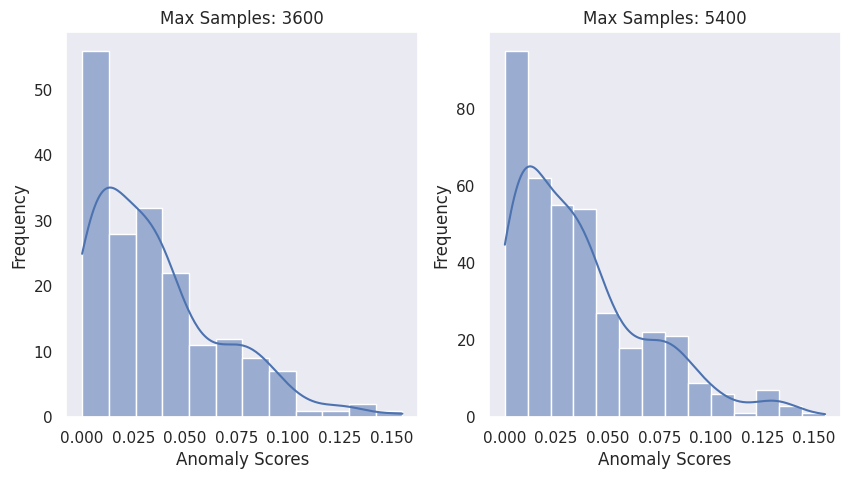

In [ ]:
max_samples_vals = [3600,5400]

isolation_forest = sklearn.ensemble.IsolationForest(n_estimators=100, max_samples = 3600)

fig, axes = plt.subplots(1, len(max_samples_vals), figsize=(5*len(max_samples_vals), 5))

isf_scores = np.zeros((len(max_samples_vals), 7200))

for i, max_samples in enumerate(max_samples_vals):

    isolation_forest = sklearn.ensemble.IsolationForest(n_estimators=100, max_samples = max_samples)

    isolation_forest.fit(df.to_numpy())

    isf_scores[i,:] =  - isolation_forest.decision_function(df.to_numpy())

    sns.histplot(isf_scores[isf_scores > 0], kde=True, ax=axes[i])
    axes[i].set_title(f"Max Samples: {max_samples}")
    axes[i].set_xlabel("Anomaly Scores")
    axes[i].set_ylabel("Frequency")

plt.show()

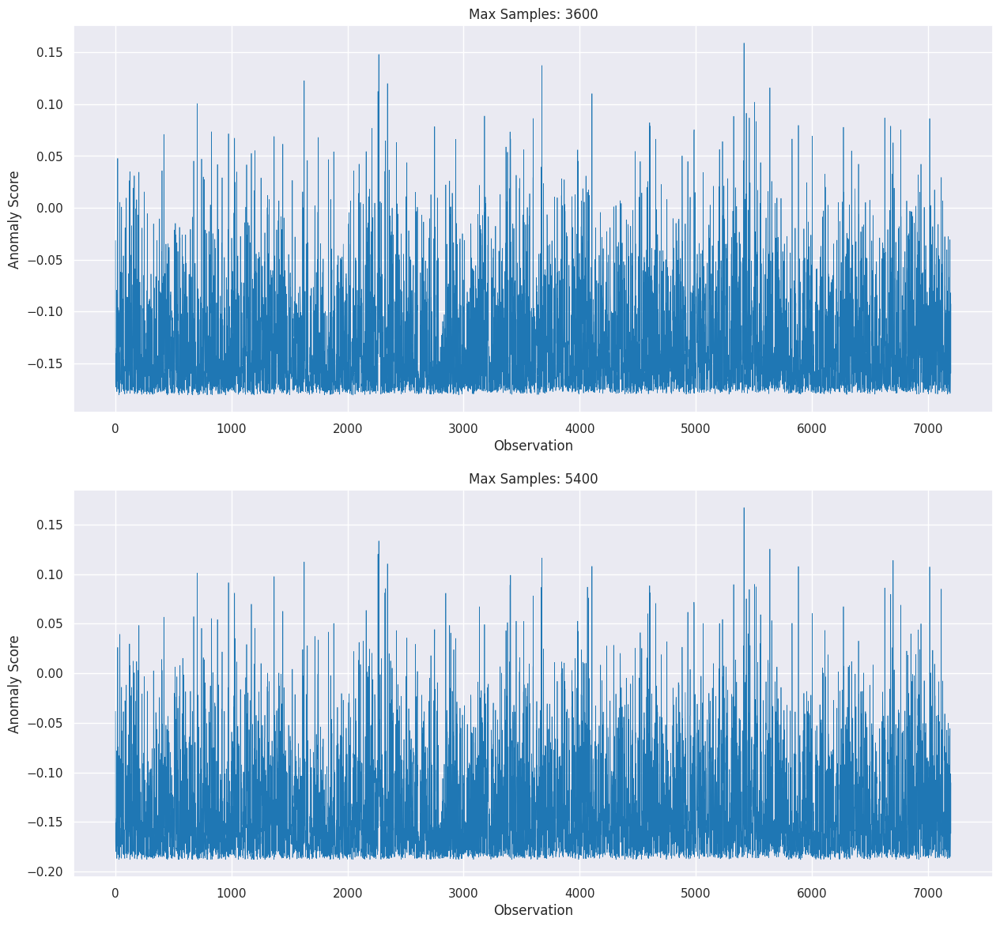

In [ ]:
fig, axes = plt.subplots(len(max_samples_vals), 1, figsize=(15, 7*len(max_samples_vals)))

for i, max_samples in enumerate(max_samples_vals):
    axes[i].plot(isf_scores[i,:], color='tab:blue', linewidth=0.5)
    axes[i].set_title(f"Max Samples: {max_samples}")
    axes[i].set_xlabel("Observation")
    axes[i].set_ylabel("Anomaly Score")
    axes[i].grid()

plt.show()

In [ ]:

# collapse negative values to 0, now the metric is well behaved
isf_scores = np.maximum(isf_scores, 0)

for i in range(isf_scores.shape[0]):
    isf_scores[i,:] = (isf_scores[i,:] - np.min(isf_scores[i,:])) / (np.max(isf_scores[i,:]) - np.min(isf_scores[i,:]))

scores['isolation']['isf'] = isf_scores

## **Proximity model free** ✅

In [ ]:
scores['proximity'] = {}

### **Nearest Neighbors**

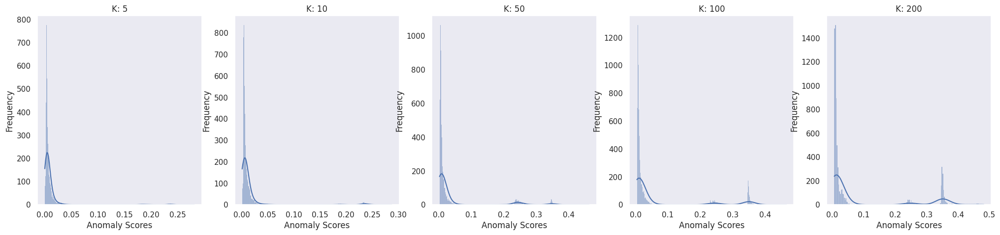

In [ ]:
ks = [5, 10, 50, 100, 200]

distance_matrix = composite_distance_matrix_single(df.to_numpy())

fig, axes = plt.subplots(1, len(ks), figsize=(5*len(ks), 5))


d_ks = np.zeros((len(ks), 7200))

for i, k in enumerate(ks):

    ## compute d_k distances

    # for every row in the distance matrix, sort it and take the kth value
    # since indexing starts from 0, we need no correction to account for the diagonal element (of distance 0)
    for j in range(distance_matrix.shape[0]):
        d_ks[i,j] = np.sort(distance_matrix[j,:])[k]

    sns.histplot(d_ks[i,:], kde=True, ax=axes[i])
    axes[i].set_title(f"K: {k}")
    axes[i].set_xlabel("Anomaly Scores")
    axes[i].set_ylabel("Frequency")

plt.show()


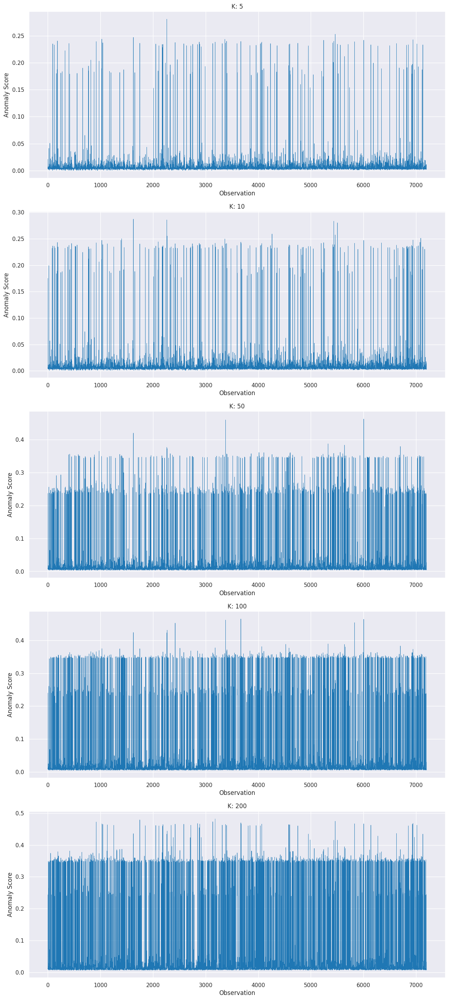

In [ ]:
fig, axes = plt.subplots(len(ks), 1, figsize=(15, 7*len(ks)))

for i, k in enumerate(ks):
    axes[i].plot(d_ks[i,:], color='tab:blue', linewidth=0.5)
    axes[i].set_title(f"K: {k}")
    axes[i].set_xlabel("Observation")
    axes[i].set_ylabel("Anomaly Score")
    axes[i].grid()

plt.show()

In [ ]:
for i in range(d_ks.shape[0]):
    d_ks[i,:] = (d_ks[i,:] - np.min(d_ks[i,:])) / (np.max(d_ks[i,:]) - np.min(d_ks[i,:]))

# leave out n = 200 as it is not well behaved
scores['proximity']['knn'] = d_ks[:4,:]

### **LOF**

/usr/local/lib/python3.11/dist-packages/sklearn/neighbors/_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(


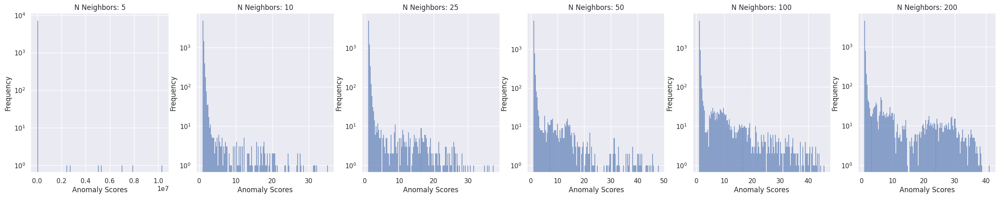

In [ ]:
ns_neighbors = [5, 10, 25, 50, 100, 200]

distance_matrix = composite_distance_matrix_single(df.to_numpy())

fig, axes = plt.subplots(1, len(ns_neighbors), figsize=(5*len(ns_neighbors), 5))


lof_values = np.zeros((len(ns_neighbors), 7200))

for i, n_neighbors in enumerate(ns_neighbors):

    ## compute lof
    #

    lof_model  = sklearn.neighbors.LocalOutlierFactor(
        n_neighbors  = n_neighbors,
        algorithm='auto',
        metric='precomputed',
        p=2,
        metric_params = None,
        contamination = 'auto'
    )

    lof_labels = lof_model.fit_predict(distance_matrix)
    lof_values[i,:] = - lof_model.negative_outlier_factor_

    sns.histplot(lof_values[i,:], bins=150, kde=False, ax=axes[i])
    axes[i].set_title(f"N Neighbors: {n_neighbors}")
    axes[i].set_xlabel("Anomaly Scores")
    axes[i].set_ylabel("Frequency")
    axes[i].set_yscale('log')
    axes[i].grid()

plt.show()

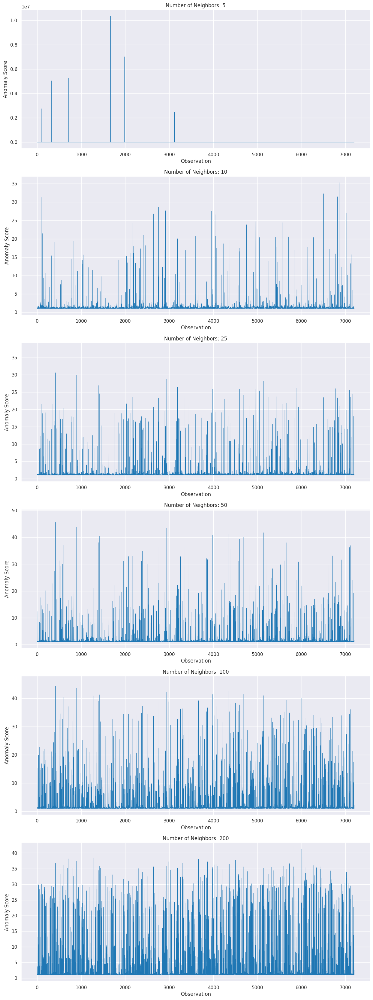

In [ ]:
fig, axes = plt.subplots(len(ns_neighbors), 1, figsize=(15, 7*len(ns_neighbors)))

for i, n_neighbors in enumerate(ns_neighbors):
    axes[i].plot(lof_values[i,:], color='tab:blue', linewidth=0.5)
    axes[i].set_title(f"Number of Neighbors: {n_neighbors}")
    axes[i].set_xlabel("Observation")
    axes[i].set_ylabel("Anomaly Score")
    axes[i].grid()

plt.show()

In [ ]:
#take logarithms to have less extreme variation
lof_values = np.log(lof_values + np.ones_like(lof_values))

for i in range(lof_values.shape[0]):
    lof_values[i,:] = (lof_values[i,:] - np.min(lof_values[i,:])) / (np.max(lof_values[i,:]) - np.min(lof_values[i,:]))

# first and last scores are not well behaved
scores['proximity']['lof'] = lof_values[1:5,:]

# **5 - Final Decision**

To obtain a final decision I will try to ensamble my model scores. I will aggregate them within methods' families and then aggregate again with custom weights.

In [ ]:
custering_scores = 0.7 * scores['clustering']['hierarchical'] + 0.3 * scores['clustering']['dbscan']

In [ ]:
reconstruction_scores = 0.8 * np.mean(scores['reconstruction']['pca'], axis = 0) + 0.2 * np.mean(scores['reconstruction']['autoencoder'], axis = 0)

In [ ]:
isolation_scores = 0.5 * np.mean(scores['isolation']['isf'], axis = 0) + 0.5 * np.mean(scores['isolation']['ocsvm'], axis = 0)

In [ ]:
proximity_scores = 0.5 * np.mean(scores['proximity']['lof'], axis = 0) + 0.5 * np.mean(scores['proximity']['knn'], axis = 0)

In [ ]:
final_scores = 0.5 * custering_scores + 0.20 * isolation_scores + 0.20 * proximity_scores  + 0.10 * reconstruction_scores

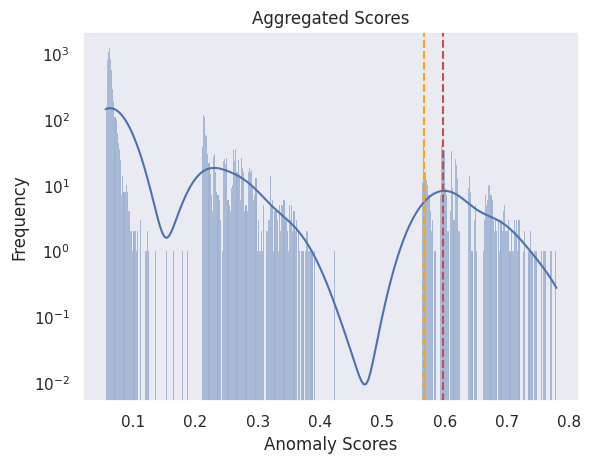

In [ ]:
sns.histplot(final_scores, kde = True)
percentile_95_value = np.percentile(final_scores, 95)
plt.axvline(percentile_95_value, color='r', linestyle='--', label=f'95th Percentile: {percentile_value:.2f}')
percentile_93_value = np.percentile(final_scores, 93)
plt.axvline(percentile_93_value, color='orange', linestyle='--', label=f'93th Percentile: {percentile_value:.2f}')

plt.title(f"Aggregated Scores")
plt.xlabel("Anomaly Scores")
plt.ylabel("Frequency")
plt.yscale('log')

plt.show()

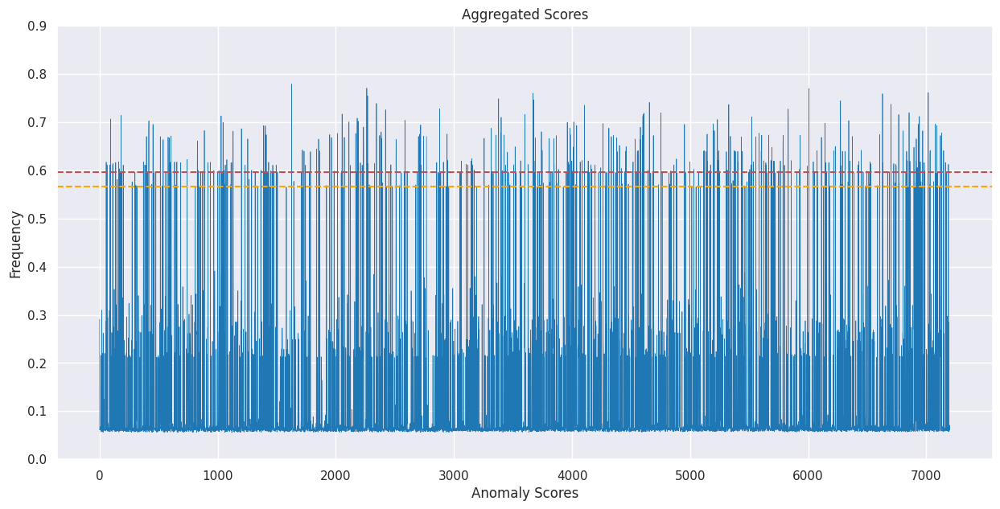

In [ ]:
fig = plt.figure(figsize=(15, 7))
plt.plot(final_scores, color='tab:blue', linewidth=0.5)
plt.axhline(percentile_93_value, color='orange', linestyle='--', label=f'93th Percentile: {percentile_93_value:.2f}')
plt.axhline(percentile_95_value, color='r', linestyle='--', label=f'93th Percentile: {percentile_95_value:.2f}')
plt.title(f"Aggregated Scores")
plt.xlabel("Anomaly Scores")
plt.ylabel("Frequency")
plt.yticks(0.1 * np.arange(10))
plt.grid()

plt.show()

In [ ]:
outliers_93 = (final_scores > percentile_93_value).astype('int')
outliers_95 = (final_scores > percentile_95_value).astype('int')

print(f"outliers at 93rd percentile: {outliers_93.sum()}")
print(f"outliers at 95th percentile: {outliers_95.sum()}")

outliers at 93rd percentile: 504
outliers at 95th percentile: 360


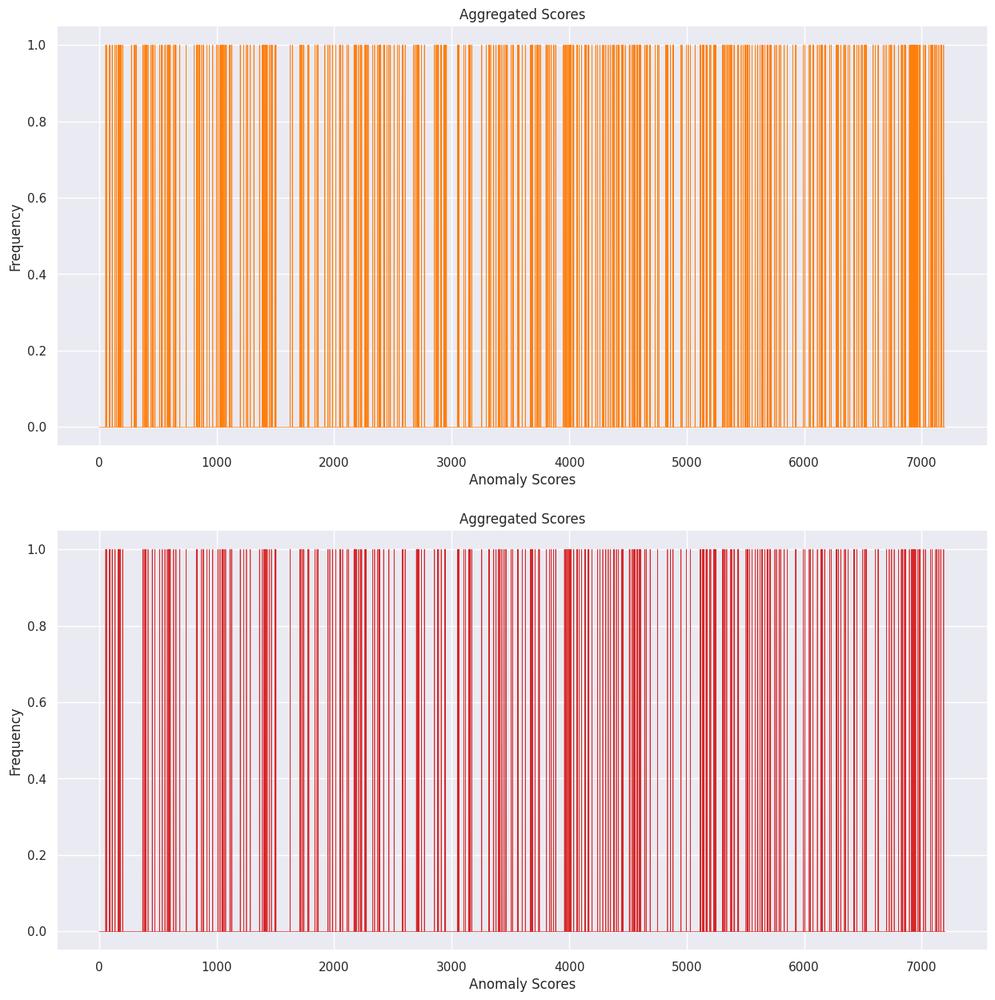

In [ ]:
fig, axs = plt.subplots(2, 1, figsize=(15, 15))

axs[0].plot(outliers_93, color='tab:orange', linewidth=0.5)
axs[0].set_title(f"Aggregated Scores")
axs[0].set_xlabel("Anomaly Scores")
axs[0].set_ylabel("Frequency")
axs[0].grid()

axs[1].plot(outliers_95, color='tab:red', linewidth=0.5)
axs[1].set_title(f"Aggregated Scores")
axs[1].set_xlabel("Anomaly Scores")
axs[1].set_ylabel("Frequency")
axs[1].grid()

plt.show()

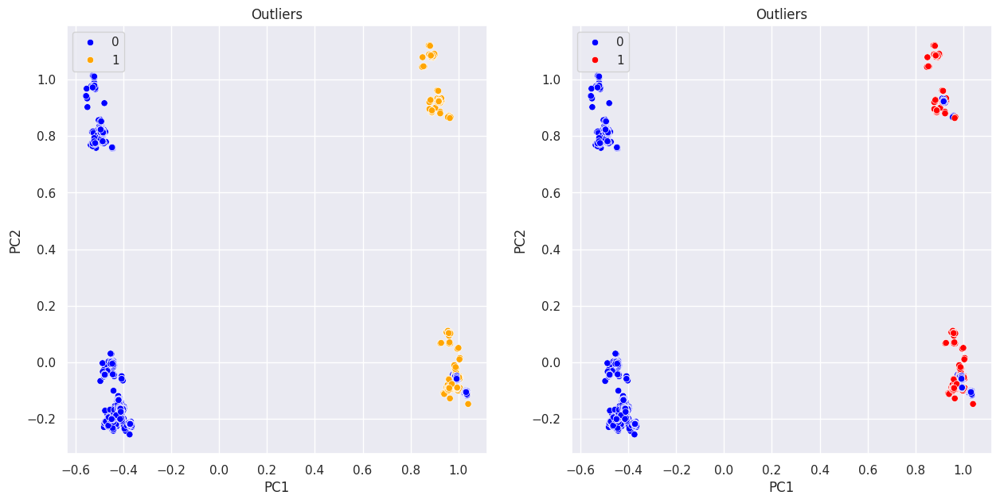

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 7))

sns.scatterplot(
    data = X_proj_df,
    x = 'PC1',
    y = 'PC2',
    hue = outliers_93,
    palette={True: 'orange', False: 'blue'},
    ax = axs[0]
)
axs[0].set_title(f"Outliers")
axs[0].grid()

sns.scatterplot(
    data = X_proj_df,
    x = 'PC1',
    y = 'PC2',
    hue = outliers_95,
    palette={True: 'red', False: 'blue'},
    ax = axs[1]
)
axs[1].set_title(f"Outliers")
axs[1].grid()

plt.show()

In [ ]:
# upload the dataset
!curl -o dataset.csv https://raw.githubusercontent.com/danmonuni/unsuplearn_fp/refs/heads/main/data/dataset.csv

# check its csv formatting
with open('dataset.csv', 'r') as f:
        print(f.readline())
        print(f.readline())
        print(f.readline())

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  645k  100  645k    0     0   944k      0 --:--:-- --:--:-- --:--:--  945k
Row;Dim_0;Dim_1=0;Dim_2=0;Dim_3=0;Dim_4=0;Dim_5=0;Dim_6=0;Dim_7=0;Dim_8=0;Dim_9=0;Dim_10=0;Dim_11=0;Dim_12=0;Dim_13=0;Dim_14=0;Dim_15=0;Dim_16;Dim_17;Dim_18;Dim_19;Dim_20;;

0;0,750000;1;0;1;1;1;1;1;0;1;1;1;1;1;1;1;0,001132;0,080780;0,197324;0,300926;0,225000;;

1;0,239583;1;1;1;1;1;1;1;1;1;1;1;1;1;1;1;0,000472;0,164345;0,235786;0,537037;0,165625;;



In [ ]:
# bash scritp to change the formatting of the csv file
!sed -i 's/;;//' dataset.csv
!sed -i 's/,/./g' dataset.csv
!sed -i 's/;/,/g' dataset.csv

# check conversion
with open('dataset.csv', 'r') as f:
        print(f.readline())
        print(f.readline())
        print(f.readline())

Row,Dim_0,Dim_1=0,Dim_2=0,Dim_3=0,Dim_4=0,Dim_5=0,Dim_6=0,Dim_7=0,Dim_8=0,Dim_9=0,Dim_10=0,Dim_11=0,Dim_12=0,Dim_13=0,Dim_14=0,Dim_15=0,Dim_16,Dim_17,Dim_18,Dim_19,Dim_20

0,0.750000,1,0,1,1,1,1,1,0,1,1,1,1,1,1,1,0.001132,0.080780,0.197324,0.300926,0.225000

1,0.239583,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0.000472,0.164345,0.235786,0.537037,0.165625



In [ ]:
# load the dataset with pandas
df = pd.read_csv('dataset.csv', index_col = 0)

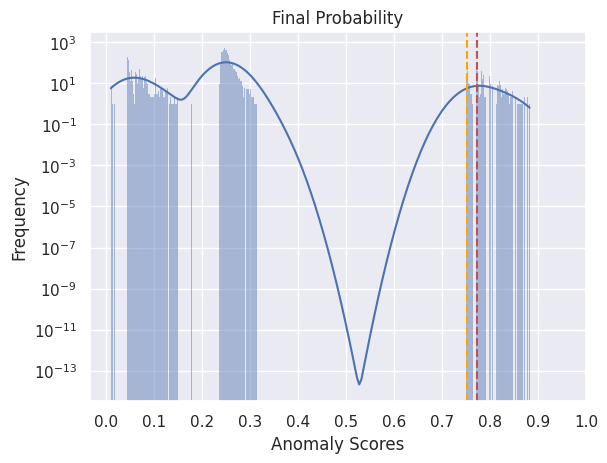

In [ ]:
outlier_probability = np.where((final_scores >= 0.1) & (final_scores < 0.5), final_scores**2, np.sqrt(final_scores))

sns.histplot(outlier_probability, kde = True)
percentile_95_value = np.percentile(outlier_probability, 95)
plt.axvline(percentile_95_value, color='r', linestyle='--', label=f'95th Percentile: {percentile_95_value:.2f}')
percentile_93_value = np.percentile(outlier_probability, 93)
plt.axvline(percentile_93_value, color='orange', linestyle='--', label=f'93th Percentile: {percentile_93_value:.2f}')

plt.title(f"Final Probability")
plt.xlabel("Anomaly Scores")
plt.xticks(0.1 * np.arange(11))
plt.ylabel("Frequency")
plt.yscale('log')
plt.grid()
plt.show()

df['outlier_decision'] = outliers_93
df['outlier_probability'] = outlier_probability


df.to_csv('data.csv', index=False)